In [ ]:

from brainspace.datasets import load_conte69, load_mask
from brainspace.plotting import plot_hemispheres
from brainspace.utils.parcellation import reduce_by_labels
from brainspace.utils.parcellation import map_to_labels
from brainspace.gradient import GradientMaps
 

import os  
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, ListedColormap
import matplotlib as mpl
import numpy as np

import nibabel as nbù
from nilearn import plotting 

import sys, os
sys.path.append('/data/p_02542/dekrak/scripts/hippunfold_toolbox')
from hippunfold_toolbox import plotting
import hippunfold_toolbox 



In [ ]:


def parula_cmap(): 
    
    cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
     [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
     [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
      0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
     [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
      0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
     [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
      0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
     [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
      0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
     [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
      0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
     [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
      0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
      0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
     [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
      0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
     [0.0589714286, 0.6837571429, 0.7253857143], 
     [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
     [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
      0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
     [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
      0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
     [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
      0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
     [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
      0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
     [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
     [0.7184095238, 0.7411333333, 0.3904761905], 
     [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
      0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
     [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
     [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
      0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
     [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
      0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
     [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
     [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
     [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
      0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
     [0.9763, 0.9831, 0.0538]]
    
    parula_map = LinearSegmentedColormap.from_list('parula', cm_data)
    
    return parula_map


In [ ]:


SUBJ_LIST = 'subjects...txt'


with open(SUBJ_LIST, 'r') as f: 
    subjects_to_include = [line.strip() for line in f.readlines()]

print(f"Number of subjects to consider: {len(subjects_to_include)}")
print("First few subjects:", subjects_to_include[:10])



In [ ]:
 

hippunfold_dir = '.../hcp-hippunfold'




vertex_metrics = {
    'thickness': [],
    'surfarea': [],
    'gyrification': [],
    'curvature': [],
    't1wt2w': []
}

for subjID in subjects_to_include:
    subj_surf_dir = os.path.join(hippunfold_dir, subjID, 'surf')

    
    metric_files = {
        'thickness': f"{subjID}_hemi-L_space-T1w_den-0p5mm_label-hipp_thickness.shape.gii",
        'surfarea': f"{subjID}_hemi-L_space-T1w_den-0p5mm_label-hipp_surfarea.shape.gii",
        'gyrification': f"{subjID}_hemi-L_space-T1w_den-0p5mm_label-hipp_gyrification.shape.gii",
        'curvature': f"{subjID}_hemi-L_space-T1w_den-0p5mm_label-hipp_curvature.shape.gii",
    }
 
    for metric, fname in metric_files.items():
        fpath = os.path.join(subj_surf_dir, fname)
        data = nb.load(fpath).agg_data()  # shape: (num_vertices,)
        vertex_metrics[metric].append(data)  
 
for metric in vertex_metrics:
    vertex_metrics[metric] = np.array(vertex_metrics[metric])  
    

print("Thickness shape across subjects:", vertex_metrics['thickness'].shape)

Thickness shape across subjects: (867, 7262)


In [ ]:



ave = '.../groupAve/'


surface_ave = nb.load(os.path.join(ave, 'average_L_space-T1w_den-0p5mm_label-hipp_midthickness.surf.gii'))


print(surface_ave.darrays[0].data)

print(surface_ave.darrays[1].data)



[[-12.366673   -8.714597  -17.766777 ]
 [-16.440132  -13.6091385 -14.313196 ]
 [-16.291166  -13.991536  -14.648606 ]
 ...
 [-26.210974  -21.90574   -12.928628 ]
 [-26.379414  -22.562733  -12.574167 ]
 [-26.452812  -22.896595  -12.3987465]]
[[ 145  242  240]
 [ 242  305  240]
 [   4  358   29]
 ...
 [4490 4491 4474]
 [4490 4473 4472]
 [4489 4490 4472]]



# Hipp-Hipp T1/T2 Scov


In [ ]:
 

mye_scov_hh = np.load('.../mye_hipp.npy') 

mye_scov_hh.shape

(7262, 866)

In [ ]:
 
print("Minimum :", np.nanmin(mye_scov_hh))   
print("Maximum :", np.nanmax(mye_scov_hh))   
print("Mean :", np.nanmean(mye_scov_hh))    
print("Standard Deviation :", np.nanstd(mye_scov_hh))


Minimum : 0.19655219
Maximum : 96.552826
Mean : 2.3427026
Standard Deviation : 2.0079422


In [10]:

mye_scov_hh = np.corrcoef(mye_scov_hh)  
mye_scov_hh.shape  


(7262, 7262)

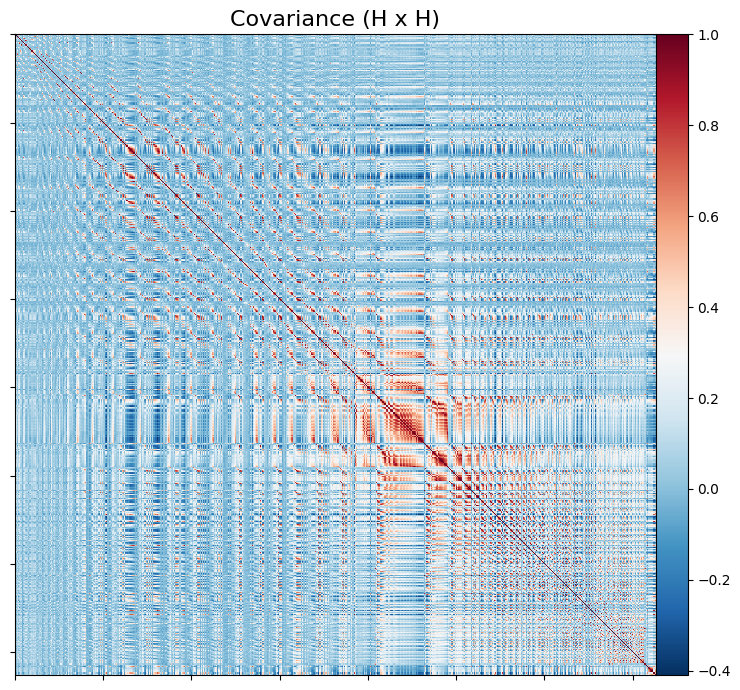

In [ ]:
 

display = plotting.plot_matrix(mye_scov_hh, 
                               figure=(9, 7),  
                               title='Covariance (H x H)')  
 
plotting.show()



In [ ]:
# Apply non linear dimensionality reduction (gradients) 

gm_hh = GradientMaps(n_components = 25, approach = 'dm', kernel='normalized_angle');
gm_hh = gm_hh.fit(mye_scov_hh);   # (7262, 10)


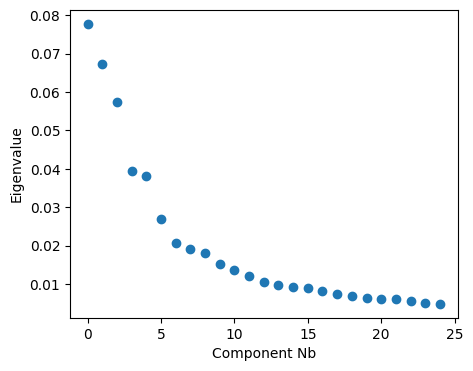

In [ ]:


fig, ax = plt.subplots(1, figsize=(5, 4))
ax.scatter(range(gm_hh.lambdas_.size), gm_hh.lambdas_)
ax.set_xlabel('Component Nb')
ax.set_ylabel('Eigenvalue')

plt.show()

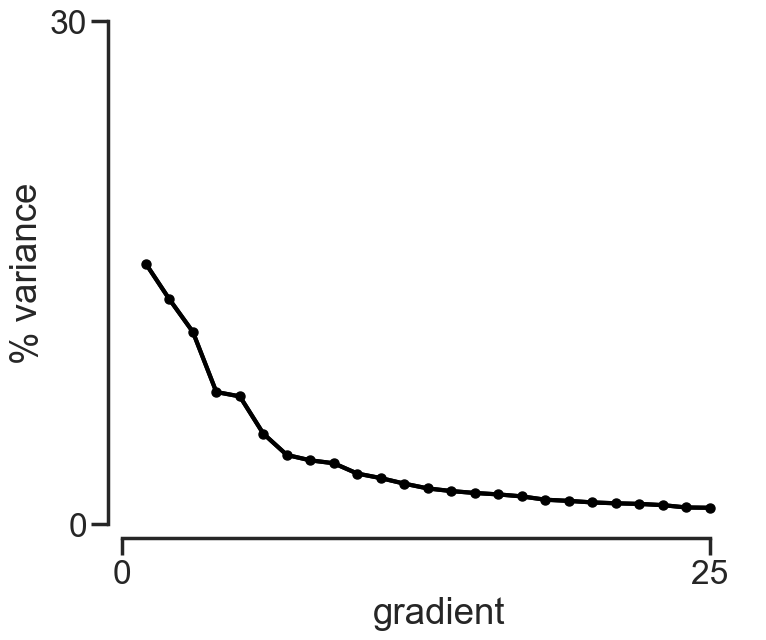

In [ ]:
 

eig_val = gm_hh.lambdas_
# percentage of varience per eigenvector 
perc_var = eig_val / np.sum(eig_val)*100

sns.set_context('poster', font_scale=1.1)
sns.set_style("ticks")
fig=plt.figure(figsize=(15,7))

ax1 = fig.add_subplot(121)
nums = np.arange(25)
nums = nums +1 
plt.plot(nums, perc_var[0:25], color='black')
plt.plot(nums, perc_var[0:25], color='black', marker='.', markersize=13)
plt.xlim([0.5, 27])
plt.xticks([0, 25])
plt.ylim([0, 30])
plt.yticks([0, 30])
plt.ylabel('% variance')
plt.xlabel('gradient')



sns.despine(offset=10, trim=True)
fig.tight_layout()
sns.set()


In [ ]:
# extract the first three gradients

G1 = gm_hh.gradients_[:,0]
G2 = gm_hh.gradients_[:,1]
G3 = gm_hh.gradients_[:,2]

G1.shape

(7262,)

In [ ]:

def plot_surface_structure(surface_ave, data, label="Metric"):
    faces = surface_ave.darrays[1].data 
    # Average the values for each triangle
    face_values = data[faces].mean(axis=1)

    base_cmap = parula_cmap()

    vals = base_cmap(np.linspace(0, 1, 256)) 
    my_custom_cmap = ListedColormap(vals)

    fig, ax = plotting.plot_gifti(surface_ave, 'fill', cmap=False)

    mappable = ax.collections[0]

    mappable.set_array(face_values) 

    # Make the triangle edges invisible
    mappable.set_edgecolor('none') 

    mappable.set_cmap(my_custom_cmap)
    norm = Normalize(vmin=data.min(), vmax=data.max())
    mappable.set_norm(norm)

    cbar = fig.colorbar(mappable, ax=ax, shrink=0.6)
    cbar.set_label(label)

    ax.view_init(elev=90, azim=-90)
    plt.show()


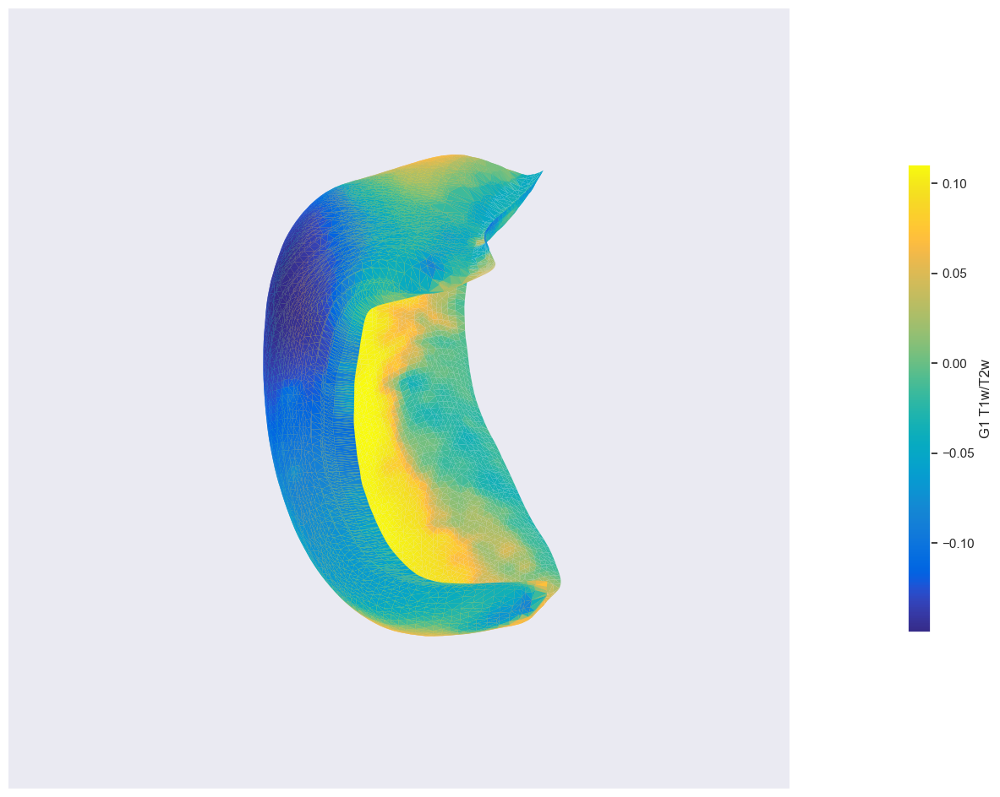

In [ ]:
 
plot_surface_structure(surface_ave, G1, label="G1 T1w/T2w") 

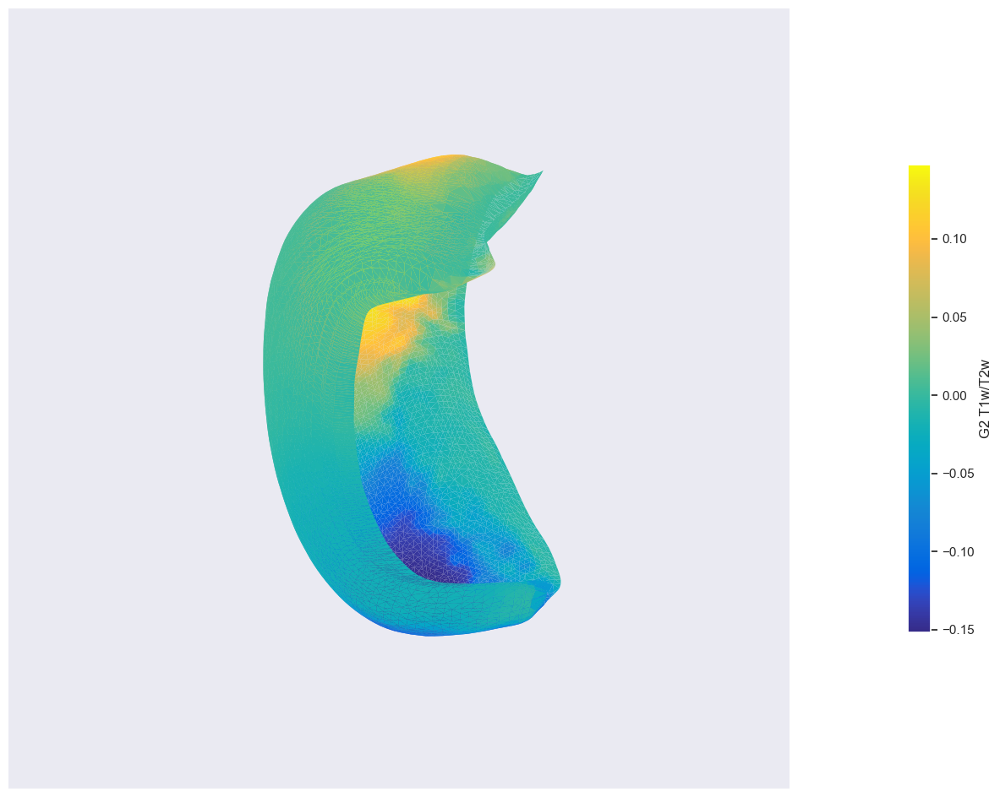

In [ ]:
 
plot_surface_structure(surface_ave, G2, label="G2 T1w/T2w")



# Hipp-Hipp Gyrification Scov


In [22]:

gyr_hipp = vertex_metrics['gyrification']

vertex_metrics['gyrification'].shape



(867, 7262)

In [ ]:
gyr_scov = np.corrcoef(gyr_hipp.T) 

gyr_scov.shape


(7262, 7262)

In [24]:

print("Minimum :", np.nanmin(gyr_scov))   
print("Maximum :", np.nanmax(gyr_scov))   
print("Mean :", np.nanmean(gyr_scov))    
print("Standard Deviation :", np.nanstd(gyr_scov))


Minimum : -0.5159464992242785
Maximum : 1.0
Mean : 0.17558387868160646
Standard Deviation : 0.1818608455463064


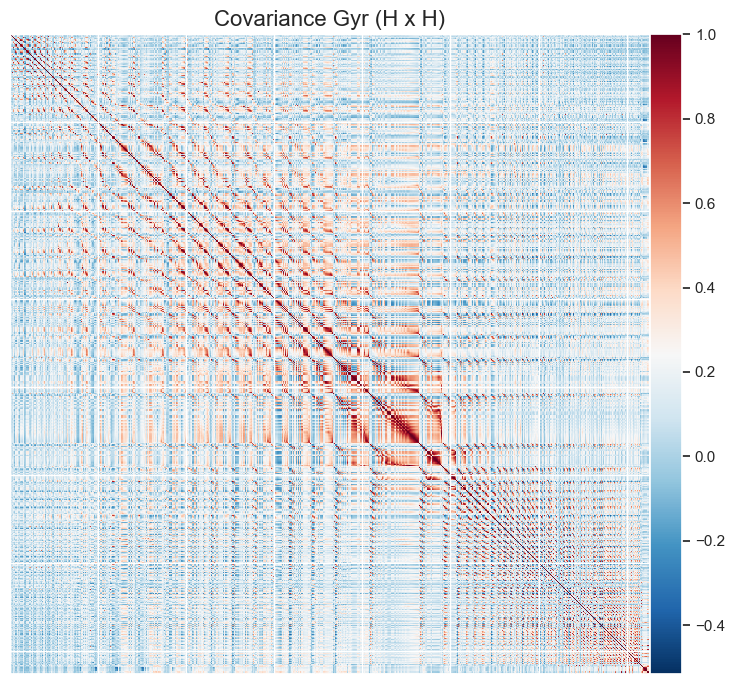

In [ ]:
 

display = plotting.plot_matrix(gyr_scov,
                               figure=(9, 7),
                               title='Covariance Gyr (H x H)')  
plotting.show()


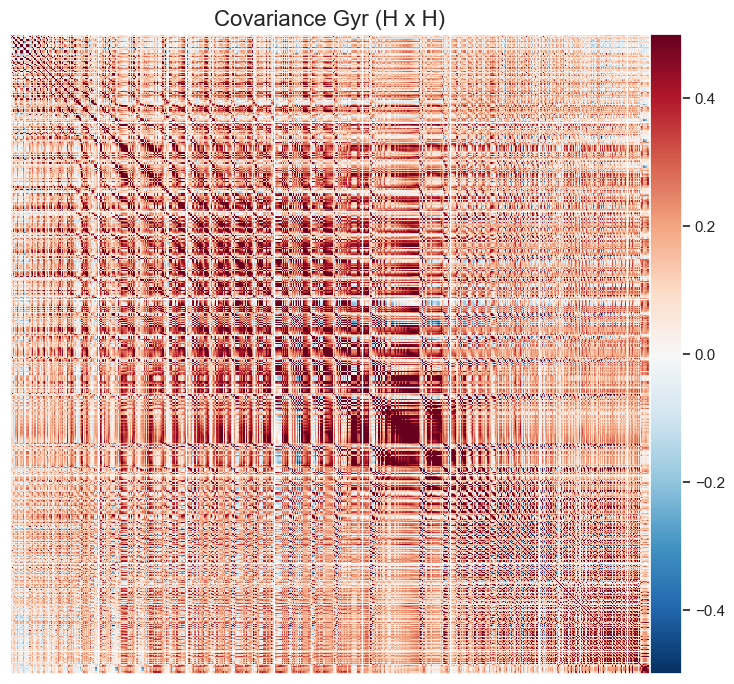

In [ ]:
 

display = plotting.plot_matrix(gyr_scov,
                               figure=(9, 7), vmax=0.5, vmin=-0.5,
                               title='Covariance Gyr (H x H)')  
plotting.show()


In [27]:

gm_gyr = GradientMaps(n_components = 25, approach = 'dm', kernel='normalized_angle');
gm_gyr = gm_gyr.fit(gyr_scov); 


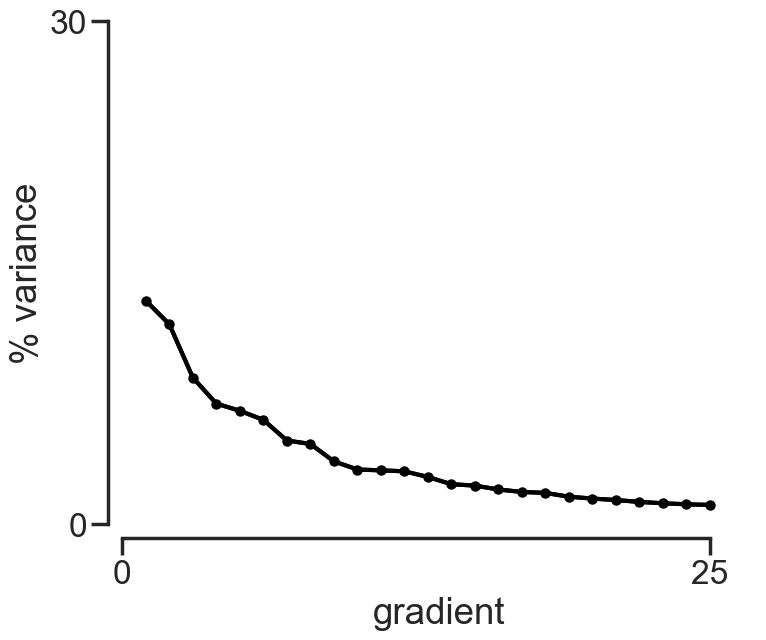

In [ ]:



eig_val = gm_gyr.lambdas_ 
perc_var = eig_val / np.sum(eig_val)*100

sns.set_context('poster', font_scale=1.1)
sns.set_style("ticks")
fig=plt.figure(figsize=(15,7))

ax1 = fig.add_subplot(121)
nums = np.arange(25)
nums = nums +1 
plt.plot(nums, perc_var[0:25], color='black')
plt.plot(nums, perc_var[0:25], color='black', marker='.', markersize=13)
plt.xlim([0.5, 27])
plt.xticks([0, 25])
plt.ylim([0, 30])
plt.yticks([0, 30])
plt.ylabel('% variance')
plt.xlabel('gradient')



sns.despine(offset=10, trim=True)
fig.tight_layout()
sns.set()


In [29]:

G1gyr = gm_gyr.gradients_[:,0]
G2gyr = gm_gyr.gradients_[:,1]
G3gyr = gm_gyr.gradients_[:,2]

gm_gyr


GradientMaps(n_components=25)

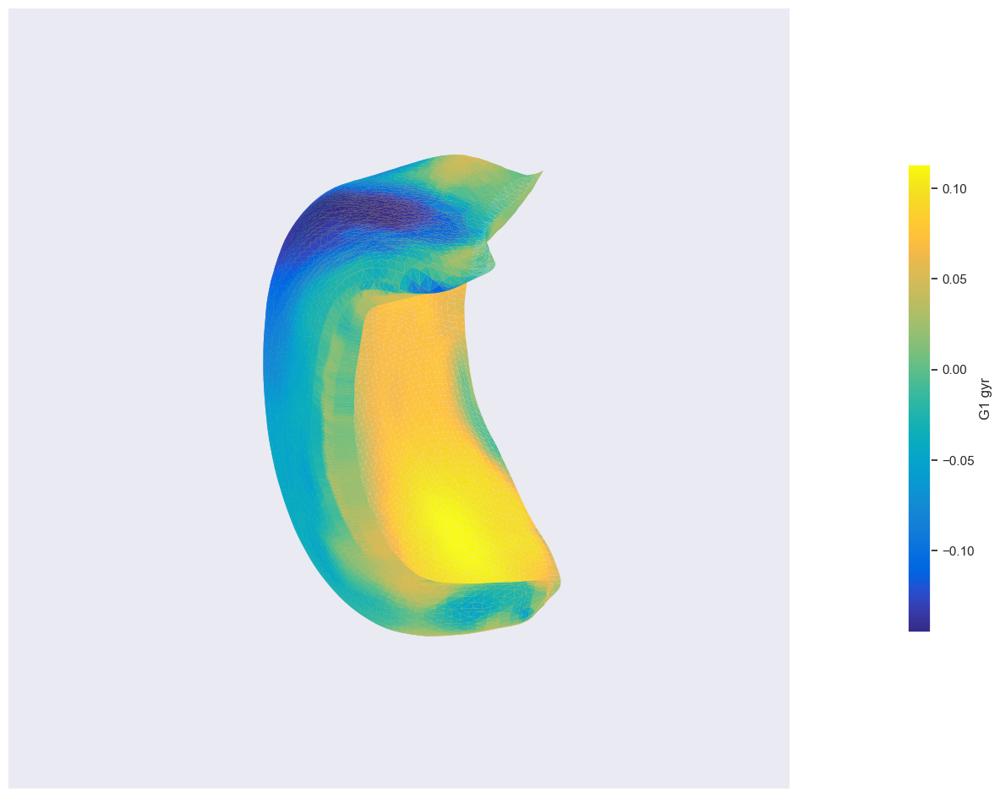

In [ ]:
 
plot_surface_structure(surface_ave, G1gyr, label="G1 gyr")


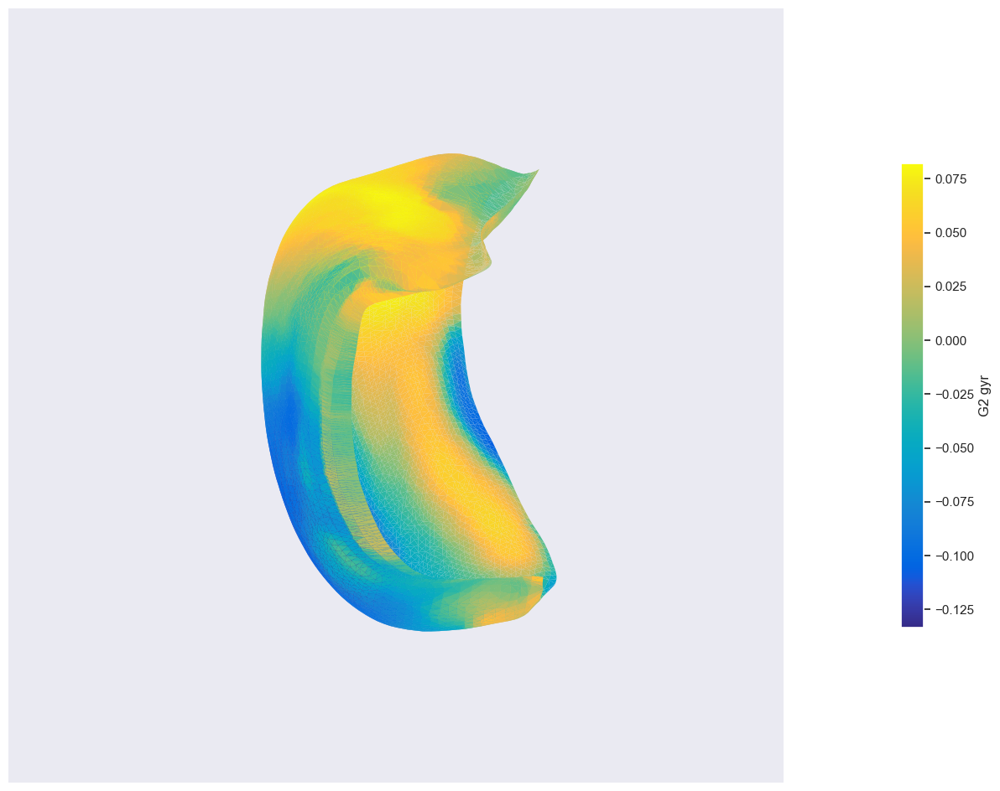

In [ ]:
  
plot_surface_structure(surface_ave, G2gyr, label="G2 gyr")



# Hipp-Hipp Surface Scov


In [ ]:

surf_hipp = vertex_metrics['surfarea']

vertex_metrics['surfarea'].shape


(867, 7262)

In [ ]:

surf_scov = np.corrcoef(surf_hipp.T) 

surf_scov.shape


(7262, 7262)

In [ ]:

print("Minimum :", np.nanmin(surf_scov))   
print("Maximum :", np.nanmax(surf_scov))   
print("Mean :", np.nanmean(surf_scov))    
print("Standard Deviation :", np.nanstd(surf_scov)) 


Minimum : -0.5159464950285196
Maximum : 1.0
Mean : 0.17558387869662148
Standard Deviation : 0.18186084557432275


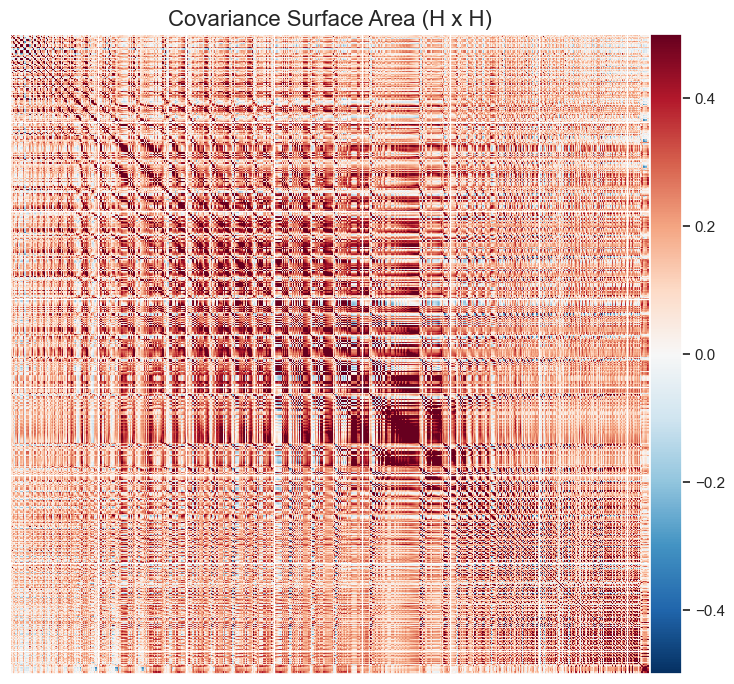

In [ ]:
 
display = plotting.plot_matrix(surf_scov,
                               figure=(9, 7), vmax=0.5, vmin=-0.5,
                               title='Covariance Surface Area (H x H)')  
plotting.show()



In [39]:

gm_surf = GradientMaps(n_components = 25, approach = 'dm', kernel='normalized_angle');
gm_surf = gm_surf.fit(gyr_scov); 



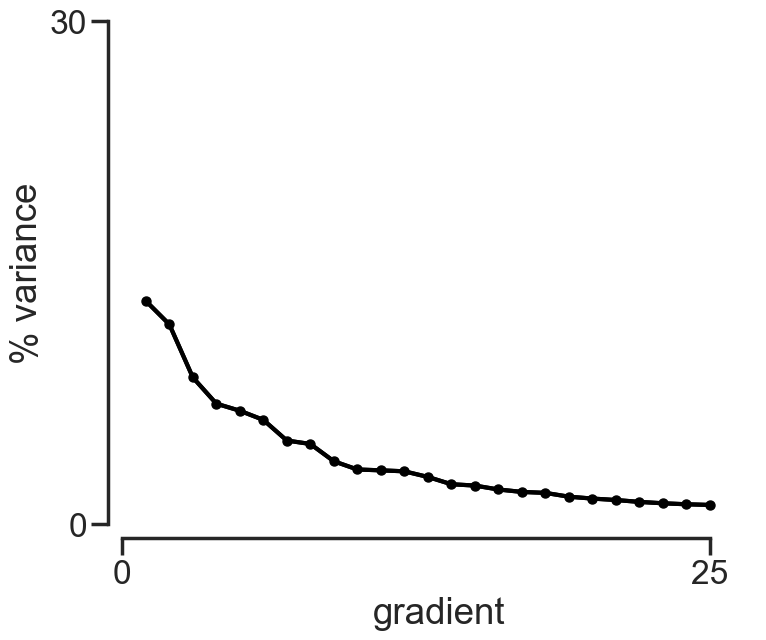

In [ ]:


eig_val = gm_surf.lambdas_ 
perc_var = eig_val / np.sum(eig_val)*100

sns.set_context('poster', font_scale=1.1)
sns.set_style("ticks")
fig=plt.figure(figsize=(15,7))

ax1 = fig.add_subplot(121)
nums = np.arange(25)
nums = nums +1 
plt.plot(nums, perc_var[0:25], color='black')
plt.plot(nums, perc_var[0:25], color='black', marker='.', markersize=13)
plt.xlim([0.5, 27])
plt.xticks([0, 25])
plt.ylim([0, 30])
plt.yticks([0, 30])
plt.ylabel('% variance')
plt.xlabel('gradient')



sns.despine(offset=10, trim=True)
fig.tight_layout()
sns.set()


In [41]:

G1surf = gm_surf.gradients_[:,0]
G2surf = gm_surf.gradients_[:,1]
G3surf = gm_surf.gradients_[:,2]

G1surf.shape



(7262,)


# Hipp Hipp Thickness Scov 


In [47]:

thick_hipp = vertex_metrics['thickness']
thick_hipp


array([[1.1347022 , 1.0975989 , 0.73392   , ..., 2.1473393 , 2.230686  ,
        2.236987  ],
       [1.3261476 , 0.8974591 , 0.48837963, ..., 2.9574733 , 1.9949285 ,
        2.7349849 ],
       [0.8625372 , 0.9549981 , 0.67443955, ..., 2.5782402 , 2.0952759 ,
        2.4435375 ],
       ...,
       [0.5669707 , 0.70065767, 0.45048398, ..., 2.608217  , 1.8452083 ,
        1.4694431 ],
       [0.91435856, 0.72381955, 0.16630694, ..., 2.1545832 , 2.3774476 ,
        2.2492695 ],
       [0.8980133 , 1.2461996 , 0.9707749 , ..., 2.935517  , 2.4898846 ,
        3.0998712 ]], dtype=float32)

In [ ]:

thick_scov = np.corrcoef(thick_hipp.T) 

thick_scov.shape


(7262, 7262)

In [49]:

print("Minimum :", np.nanmin(thick_scov))   
print("Maximum :", np.nanmax(thick_scov))   
print("Mean :", np.nanmean(thick_scov))    
print("Standard Deviation :", np.nanstd(thick_scov))


Minimum : -0.4515243905491574
Maximum : 1.0
Mean : 0.11365652223714065
Standard Deviation : 0.132854817440279


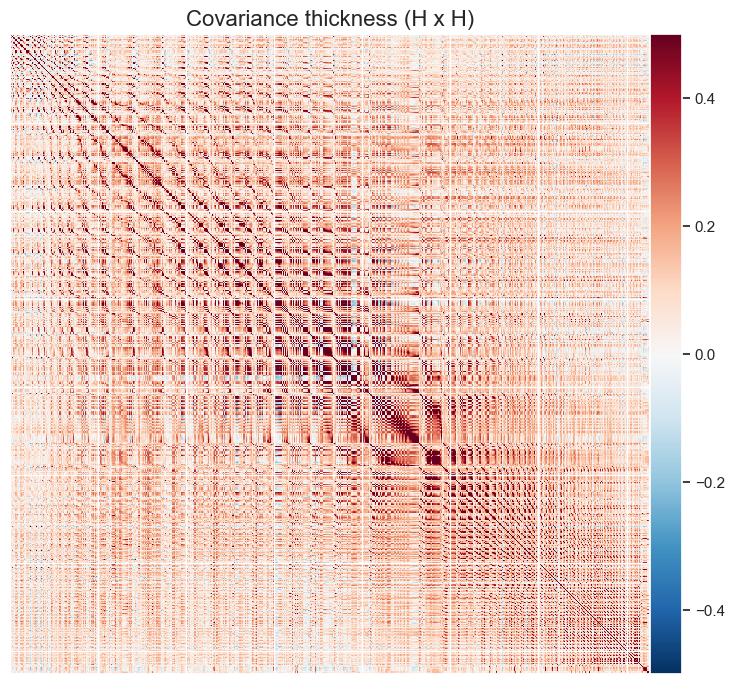

In [ ]:
 
display = plotting.plot_matrix(thick_scov,
                               figure=(9, 7), vmax=0.5, vmin=-0.5,
                               title='Covariance thickness (H x H)') 
 
plotting.show()



In [51]:

gm_thick = GradientMaps(n_components = 25, approach = 'dm', kernel='normalized_angle');
gm_thick = gm_thick.fit(thick_scov); 



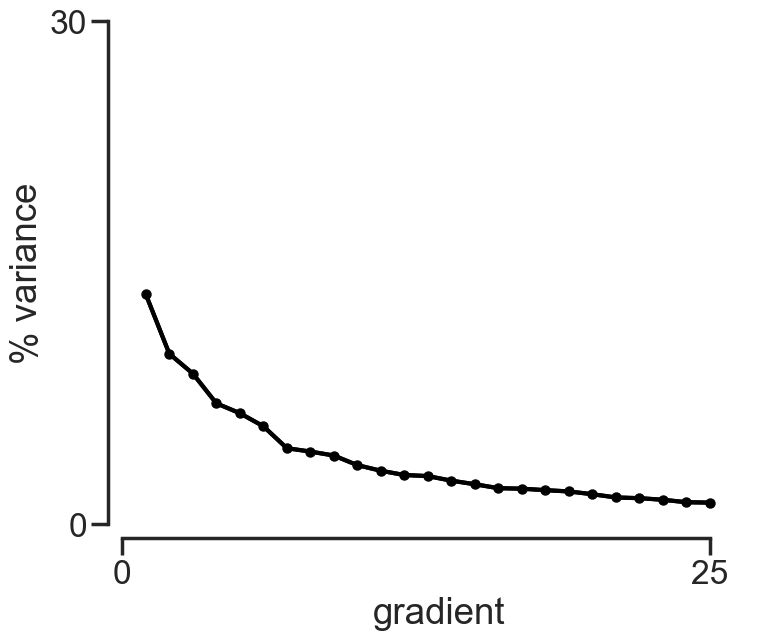

In [ ]:

eig_val = gm_thick.lambdas_ 
perc_var = eig_val / np.sum(eig_val)*100

sns.set_context('poster', font_scale=1.1)
sns.set_style("ticks")
fig=plt.figure(figsize=(15,7))

ax1 = fig.add_subplot(121)
nums = np.arange(25)
nums = nums +1 
plt.plot(nums, perc_var[0:25], color='black')
plt.plot(nums, perc_var[0:25], color='black', marker='.', markersize=13)
plt.xlim([0.5, 27])
plt.xticks([0, 25])
plt.ylim([0, 30])
plt.yticks([0, 30])
plt.ylabel('% variance')
plt.xlabel('gradient')



sns.despine(offset=10, trim=True)
fig.tight_layout()
sns.set()






In [53]:



G1thick = gm_thick.gradients_[:,0]
G2thick = gm_thick.gradients_[:,1]
G3thick = gm_thick.gradients_[:,2]

G1thick.shape


(7262,)


# Scov Curvature


In [59]:

curv_hipp = vertex_metrics['curvature']

curv_hipp


array([[ 1.40408278e-01,  3.11028838e+00, -8.90315652e-01, ...,
         1.05202653e-01,  1.18268311e-01,  9.83146429e-02],
       [ 1.74280018e-01,  5.50214863e+00, -2.09010220e+00, ...,
         1.03523716e-01,  1.05837747e-01,  1.00759059e-01],
       [ 1.62693053e-01,  5.10421658e+00, -2.21763229e+00, ...,
        -5.39138913e-02,  1.09717019e-01,  1.33202791e-01],
       ...,
       [ 1.74335241e-01,  4.24913740e+00, -1.60428286e+00, ...,
        -5.39184362e-03,  1.29040480e-01,  1.42250717e-01],
       [ 1.59481123e-01,  6.02068090e+00, -3.92856026e+00, ...,
         6.17006607e-02,  9.33002234e-02,  1.07944325e-01],
       [ 2.78584272e-01,  3.25189877e+00, -1.41126823e+00, ...,
         1.34928137e-01,  1.11653700e-01,  9.35245454e-02]], dtype=float32)

In [ ]:


curv_scov = np.corrcoef(curv_hipp.T) 

curv_scov.shape


(7262, 7262)

In [61]:

print("Minimum :", np.nanmin(curv_scov))   
print("Maximum :", np.nanmax(curv_scov))   
print("Mean :", np.nanmean(curv_scov))    
print("Standard Deviation :", np.nanstd(curv_scov))




Minimum : -0.9510654935979891
Maximum : 1.0
Mean : 0.017863820162497168
Standard Deviation : 0.24667785805530273


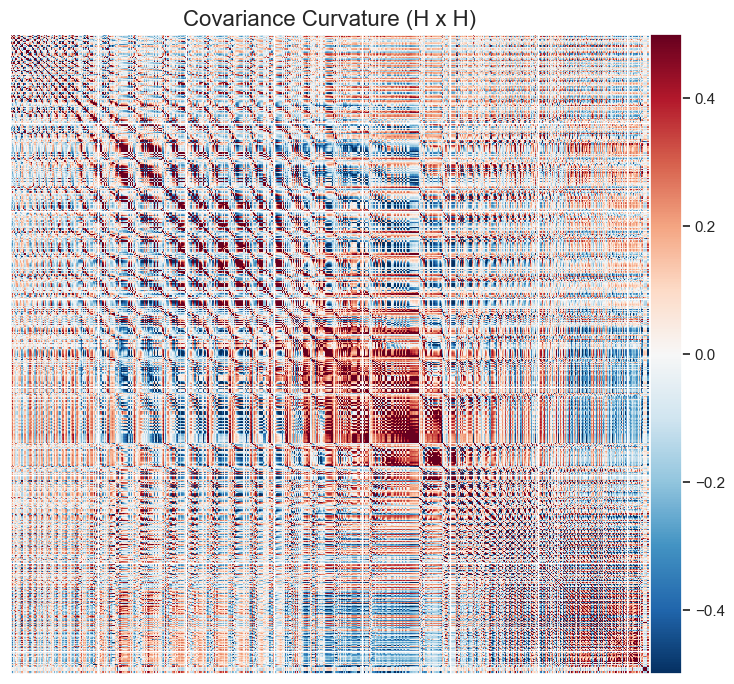

In [ ]:
 
display = plotting.plot_matrix(curv_scov,
                               figure=(9, 7), vmax=0.5, vmin=-0.5,
                               title='Covariance Curvature (H x H)')  
plotting.show()



In [63]:

gm_curv = GradientMaps(n_components = 25, approach = 'dm', kernel='normalized_angle');
gm_curv = gm_curv.fit(curv_scov); 


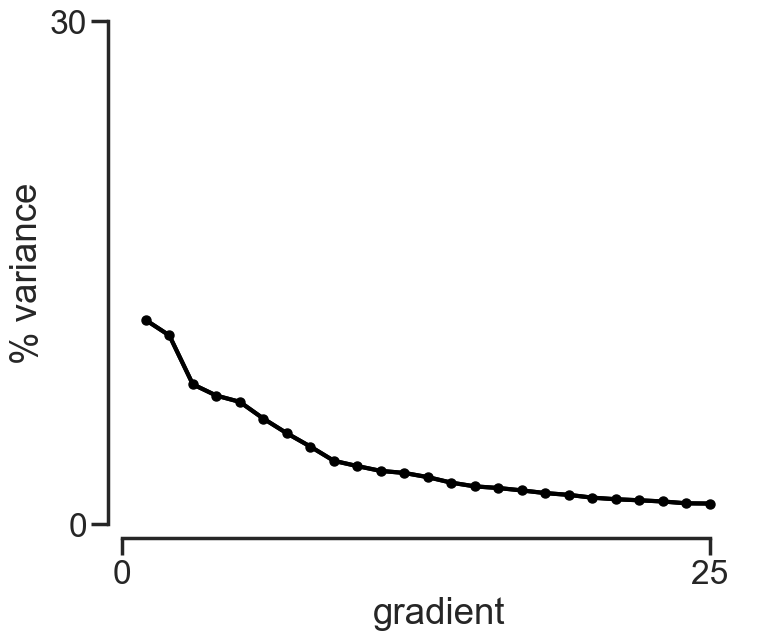

In [ ]:




eig_val = gm_curv.lambdas_ 
perc_var = eig_val / np.sum(eig_val)*100

sns.set_context('poster', font_scale=1.1)
sns.set_style("ticks")
fig=plt.figure(figsize=(15,7))

ax1 = fig.add_subplot(121)
nums = np.arange(25)
nums = nums +1 
plt.plot(nums, perc_var[0:25], color='black')
plt.plot(nums, perc_var[0:25], color='black', marker='.', markersize=13)
plt.xlim([0.5, 27])
plt.xticks([0, 25])
plt.ylim([0, 30])
plt.yticks([0, 30])
plt.ylabel('% variance')
plt.xlabel('gradient')



sns.despine(offset=10, trim=True)
fig.tight_layout()
sns.set()



In [ ]:
 
G1curv = gm_curv.gradients_[:,0]
G2curv = gm_curv.gradients_[:,1]
G3curv = gm_curv.gradients_[:,2]

G1curv.shape 


(7262,)